<h1> Анализ рынка заведений общественного питания Москвы </h1>

<h2> Краткое описание проекта </h2>

Сформировать исследование и презентацию рынка заведений общественного питания Москвы.

<h2> Цель проекта </h2>

Найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

<h2> План работы </h2>

* предобработка данных;
* изучение и проверка данных;
* детализация исследования: открытие кофейни;
* оформление презентации.

In [1]:
import re
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings; warnings.filterwarnings(action='ignore')
from sklearn.impute import KNNImputer
from plotly import graph_objects as go
from folium import Map, Choropleth
from folium import Map, Marker # импортируем карту и маркер
from folium.plugins import MarkerCluster # импортируем кластер
from folium import Map, Choropleth
import folium
import re

<h3> Загрузка данных, изучение информации, предобработка данных </h3>

In [3]:
data = pd.read_csv('moscow_places.csv')

Изучим общую информацию о датасете

In [4]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Имеется значительное количество пропусков в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Удалить их нельзя, поскольку это приведёт к искажению в исследовании.

Заполнить пропуски в hours, seats не представляется возможным поскольку это индивидуальные данные для каждого заведения.
Значение price в может иметь разное значение в разных административных районах. Заполнять данное значение по значению среднего чека будет некорректно.

Приведём значения в нижний регистр

In [6]:
for col in ['name', 'address', 'avg_bill']:
    data[col] = data[col].str.lower()

Удалим возможные пробелы и буквы "ё" в названиях заведений

In [7]:
while "  " in data.name:
    data.name= data.name.replace("  ", " ")

In [8]:
data['name'] = data['name'].str.replace('ё', 'е', regex=True)

Посмотрим имеются ли дубликаты

In [9]:
data.duplicated().sum()

0

Посмотрим имеются ли неявные дубликаты по совпадению названия заведения и адреса заведения

In [10]:
data.duplicated(subset=['name', 'address']).sum()

4

Видим 4 совпадения. Удалим их

In [11]:
data = data.drop_duplicates(subset=['name', 'address'])

Создим столбец street с названиями улиц из столбца с адресом

In [12]:
data['street'] = data['address'].str.split(', ').str[1]

Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
* логическое значение True — если заведение работает ежедневно и круглосуточно;
* логическое значение False — в противоположном случае.

In [13]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [14]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


<h3> Анализ данных </h3>

Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Затем построим визуализации.

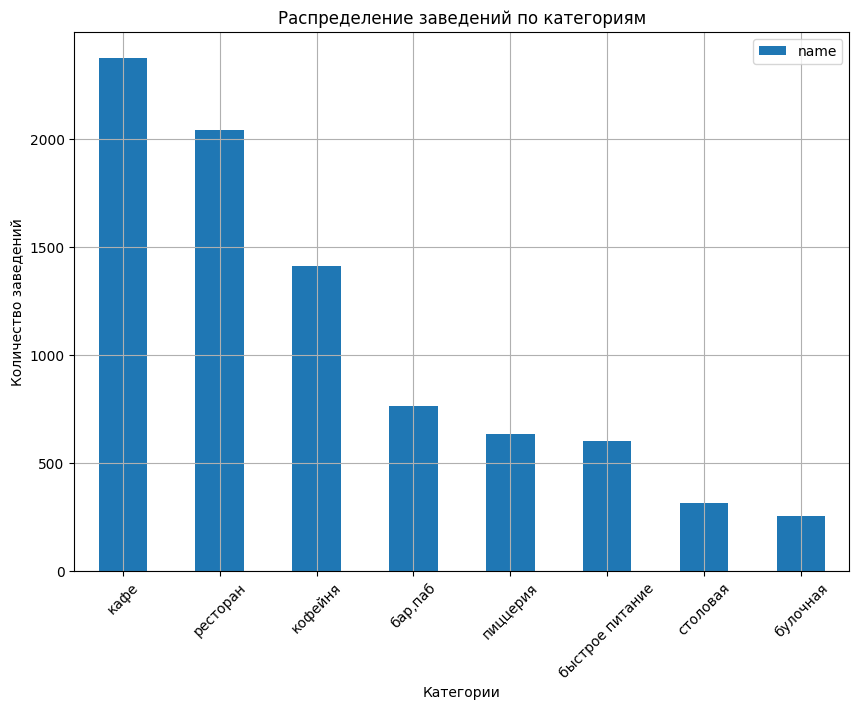

In [15]:
category_count = data.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
category_count.plot(kind = 'bar', figsize=(10, 7))
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

Можно сделать вывод что в Москве лидируют по количеству заведений кафе, рестораны и кофейни. В конце списка по количественным данным - столовые и булочные.

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Затем построим визуализации.

Сначала исследуем распределение медианного количества

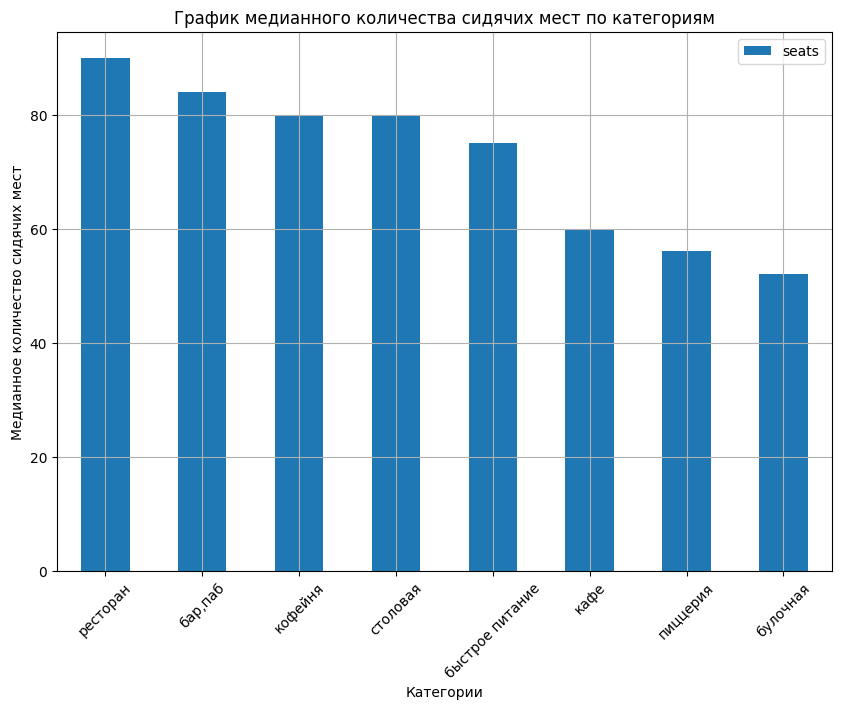

In [16]:
seats_median = data[data['seats'] != 0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False).round(2)
seats_median.plot(kind = 'bar', figsize=(10, 7), x="category")
plt.title('График медианного количества сидячих мест по категориям')
plt.ylabel('Медианное количество сидячих мест')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

Теперь исследуем распределение среднего количества сидячих мест

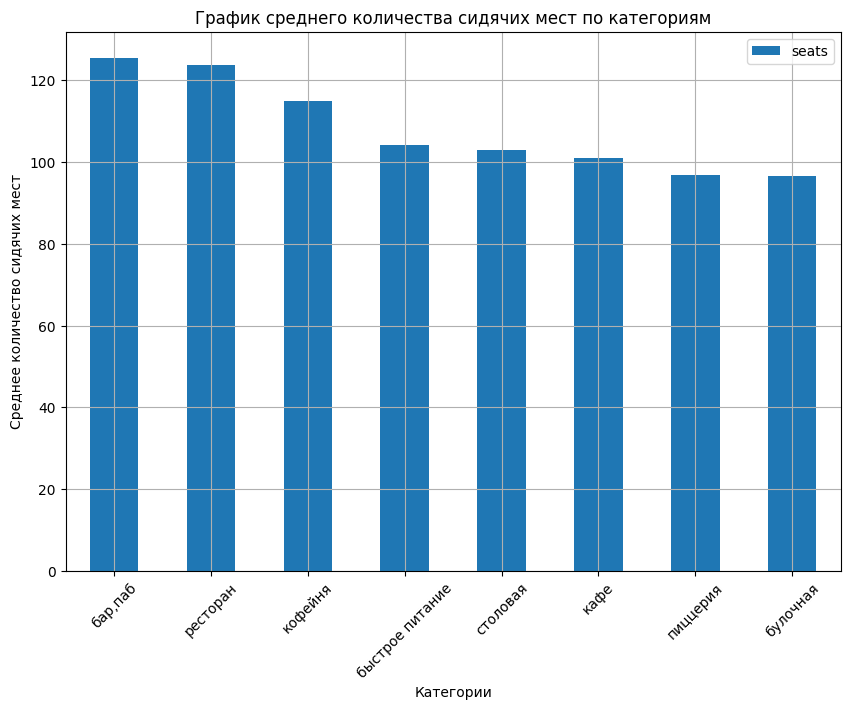

In [17]:
seats_mean = data[data['seats'] !=0].groupby('category')['seats'].mean().reset_index().sort_values(by='seats', ascending=False)
seats_mean.plot(kind = 'bar', figsize=(10, 7), x="category")
plt.title('График среднего количества сидячих мест по категориям')
plt.ylabel('Среднее количество сидячих мест')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

Наибольшее медианное количество посадочных мест - в ресторанах, барах и кофейнях (80-90). Меньше посадочных мест в заведениях быстрого питания, кафе и пиццериях (55-65), а меньше всего - в булочных (50).
Если смотреть на среднее количество посадочных мест, то здесь небольшое лидерство у баров (чуть более 120). Затем идут ресторан и кофейня.

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

Сгруппируем данные по типу объекта и сетевому признаку, подсчитав количество заведений в каждой категории

In [18]:
chain_info = data.groupby(['category', 'chain'])['name'].count().reset_index()

Сформируем данные о несетевых заведениях

In [19]:
independent = chain_info[chain_info['chain'] == False]

Сформируем данные о сетевых заведениях

In [20]:
chain = chain_info[chain_info['chain'] == True]

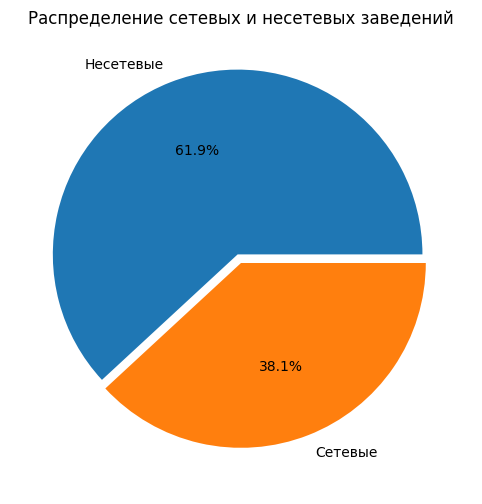

In [21]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.pie([independent['name'].sum(), chain['name'].sum()], labels=['Несетевые', 'Сетевые'], autopct='%1.1f%%', explode=[0.05, 0])
plt.title('Распределение сетевых и несетевых заведений')
plt.show()

Можем сделать вывод что 38,1% заведений являются сетевыми, а 61,9% процент заведений не являются сетевыми,

Узнаем какие категории заведений чаще являются сетевыми. Затем исследуем данные и построим график.

Зададим построение сводной таблицы с числом сетевых заведений в каждой категории

In [22]:
chain_category = data.query('chain == 1').pivot_table(index = 'category', values = 'name', aggfunc = 'count')
chain_category_merge = category_count.merge(chain_category, how='left', on='category').reset_index()
chain_category_merge.columns = ['category', 'count', 'chain']
chain_category_merge['percent'] = round(chain_category_merge['chain']/chain_category_merge['count']*100, 1)

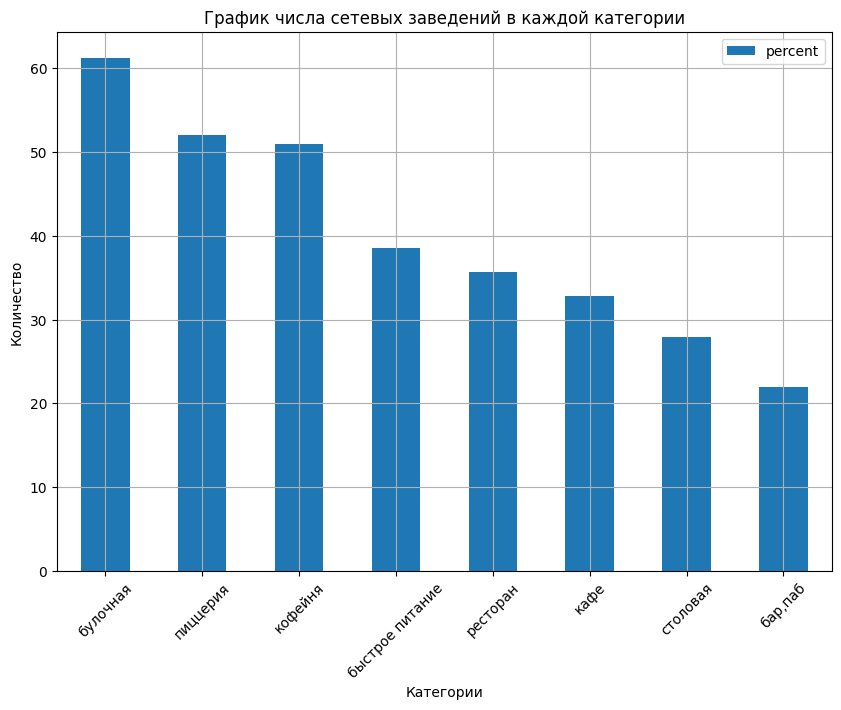

In [23]:
chain_category_merge.sort_values(by = 'percent', ascending = False).plot(kind = 'bar', figsize=(10, 7), x="category", y="percent")
plt.title('График числа сетевых заведений в каждой категории')
plt.ylabel('Количество')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

Чаще всего сетевыми заведениями являются булочные (62%), пиццерии (52%), кофейни (51%). Реже всего сетевыми заведенями становятся бары (22%).

Сгруппируем данные по названиям заведений и найдём топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Затем построим подходящую для такой информации визуализацию.

In [24]:
data_chain = data[data['chain'] == 1]
top_15 = data_chain.groupby('name').agg({'rating': 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,120
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,71
4,яндекс лавка,4.00,ресторан,69
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,кулинарная лавка братьев караваевых,4.40,кафе,39


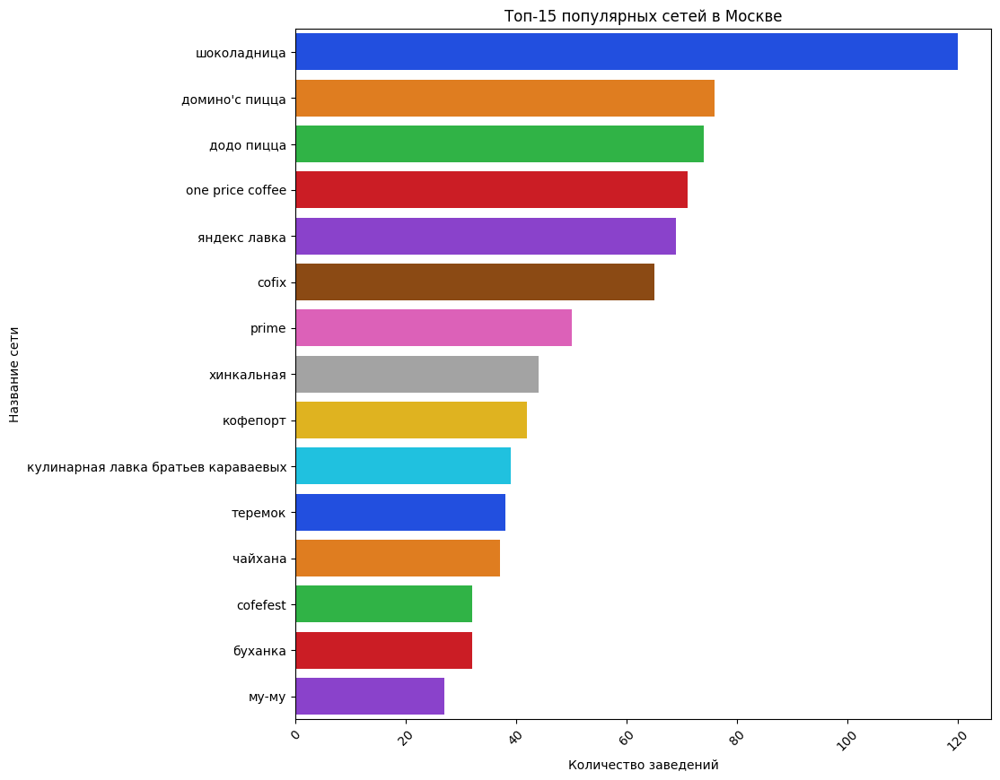

In [25]:
top_chains = top_15.sort_values(by='count', ascending=False).head(15)
plt.figure(figsize=(10,10))
sns.barplot(x='count', y='name', data=top_chains, palette='bright')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.xticks(rotation=45)
plt.show()

Из сетевых заведений по присутствию в г. Москва лидирует "Шоколадница", 2 место у "Доминос Пицца", 3 место у "Додо Пицца".

Крупными сетевиками являются кофейни и пицерии. В категории пиццерия, есть два больших игрока "Доминос Пицца" и "Додо Пицца", которые занимают большую часть категории пиццерия среди сетевых мест.

Узнаем какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений.

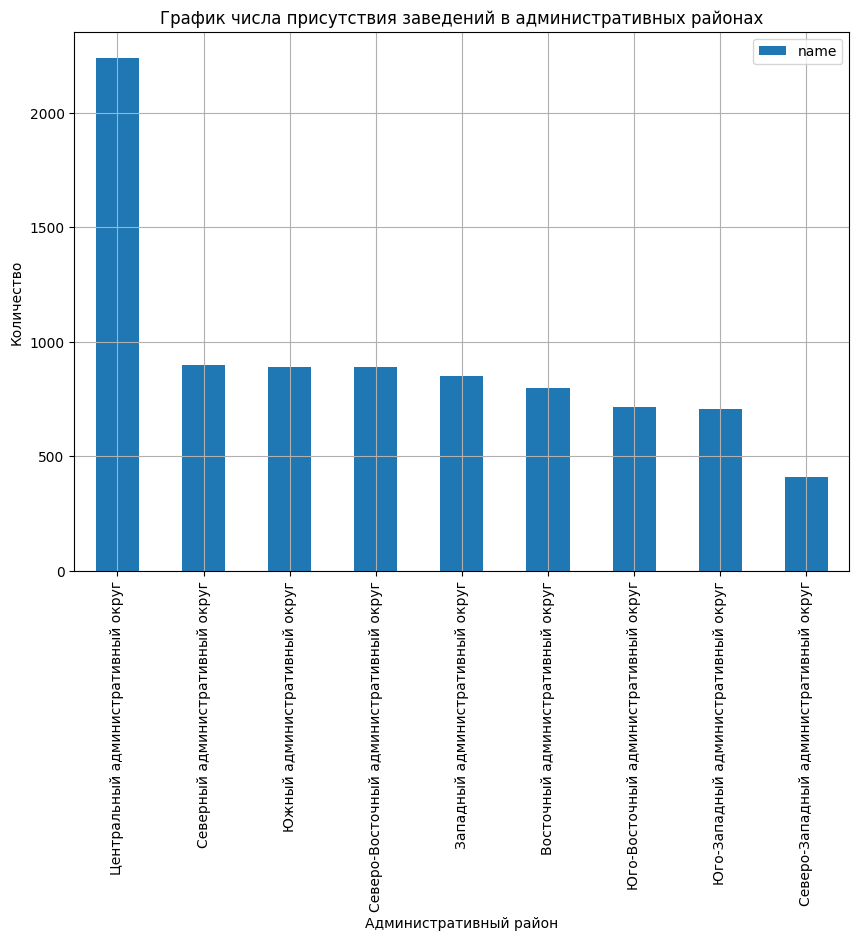

In [26]:
district = data.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
district.plot(kind = 'bar', figsize=(10, 7), x='district', y='name')
plt.title('График числа присутствия заведений в административных районах')
plt.ylabel('Количество')
plt.xlabel('Административный район')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

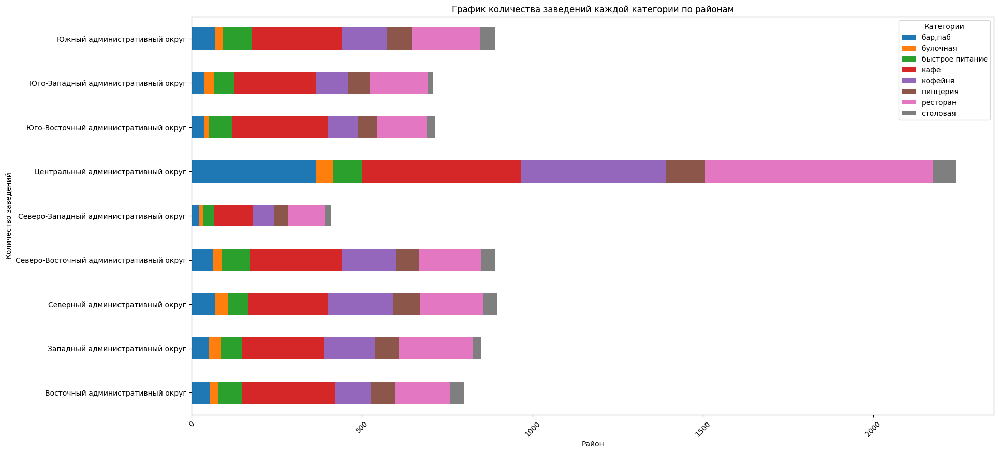

In [27]:
grouped = data.groupby(['district', 'category'])['name'].count().reset_index()
grouped.pivot_table(index = 'district', columns = 'category' , values = 'name').plot(kind = 'barh', stacked = True, figsize=(20, 10))
plt.xticks(rotation=45)
plt.title('График количества заведений каждой категории по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.legend(title='Категории', loc='upper right')
plt.show()

Центральный административный округ в лидерах с большим отрывом по количеству ресторанов, баров, кафе, кофейн и ресторанов что вполне объяснимо поскольку в данном округе много туристических мест и прогулочных зон.

Стоит отметить, что во всех округах, кроме центрального в лидерах категория "Кафе". Однако в центральном округе рестораны занимают лидирующую позицию. Стоит также отметить, что распределение количества заведений по категориям в административных округах очень похоже между собой. Выделяются в этом плане только центральный и северо-западный округа.

Визуализируем распределение средних рейтингов по категориям заведений. Рассмотрим общее описание данных в столбце с рейтингом

In [28]:
data.rating.describe()

count    8402.000000
mean        4.230017
std         0.470320
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [29]:
data.groupby('category').agg({'rating': 'describe'})

rating                                             
                  count      mean       std  min  25%  50%  75%  max
category                                                            
бар,паб           764.0  4.387696  0.380392  1.1  4.3  4.4  4.6  5.0
булочная          256.0  4.268359  0.386303  1.3  4.2  4.3  4.4  5.0
быстрое питание   603.0  4.050249  0.560949  1.1  3.9  4.2  4.3  5.0
кафе             2376.0  4.124285  0.566001  1.0  4.0  4.2  4.4  5.0
кофейня          1413.0  4.277282  0.372250  1.4  4.1  4.3  4.4  5.0
пиццерия          633.0  4.301264  0.336162  1.0  4.2  4.3  4.4  5.0
ресторан         2042.0  4.290402  0.413143  1.0  4.2  4.3  4.5  5.0
столовая          315.0  4.211429  0.454205  1.0  4.1  4.3  4.4  5.0

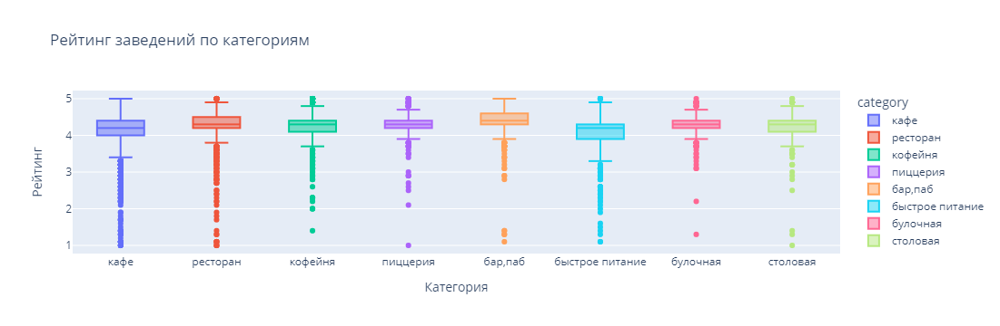

In [30]:
fig = px.box(data, y = 'rating', x = 'category', title = 'Рейтинг заведений по категориям', color = 'category')
fig.update_layout(xaxis_title = 'Категория', yaxis_title = 'Рейтинг')

Исходя из графика можем сделать вывод что наиболее высокие рейтинги у кафе и у баров. У них рейтинг доходит до 5 баллов. По остальным заведениям рейтинги ниже. 5 баллов выстречаются крайне редко. Наиболее высокие оценки у баров, хуже всего по оценкам пользователей ситуация у предприятий быстрого питания. Также замечено что у кафе, ресторанов и ресторанов быстрого питания негативных оценок встречается крайне мало по сравнению с общим количеством оценок.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [31]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)

In [32]:
state_geo =  'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=  'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson',
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

Мы видим что самый высокий рейтинг в заведениях в Центральном административном округе - 4.38. Самый низкий - в Юго-Восточном административном округе - 4.1.

Отобразим все заведения датасета на карте

In [33]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# функция, принимающая строку датафрейма, создает маркер в текущей точке и
# добавляет его в кластер marker_cluster

def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# к каждой строке датафрейма применяем функцию
data.apply(create_cluster, axis=1)

# выводим карту
m

Еще раз убеждаемся что основная масса заведений находится в центре Москвы.

Найдём топ-15 улиц по количеству заведений. Затем постройте график распределения количества заведений и их категорий по этим улицам.

Находим название улиц-лидеров по количеству заведений

In [34]:
msc_streets = data[data['street'].notnull()]
top15_streets = msc_streets['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street', 'count']
top_15_streets = top15_streets['street'].unique()

Отбираем только те строки исходного датасета где присутствуют указанные выше названия улиц

In [35]:
df_top_15_streets = data.loc[data['street'].isin(top_15_streets)]

Считаем количество заведений согласно отфильтрованного датасета

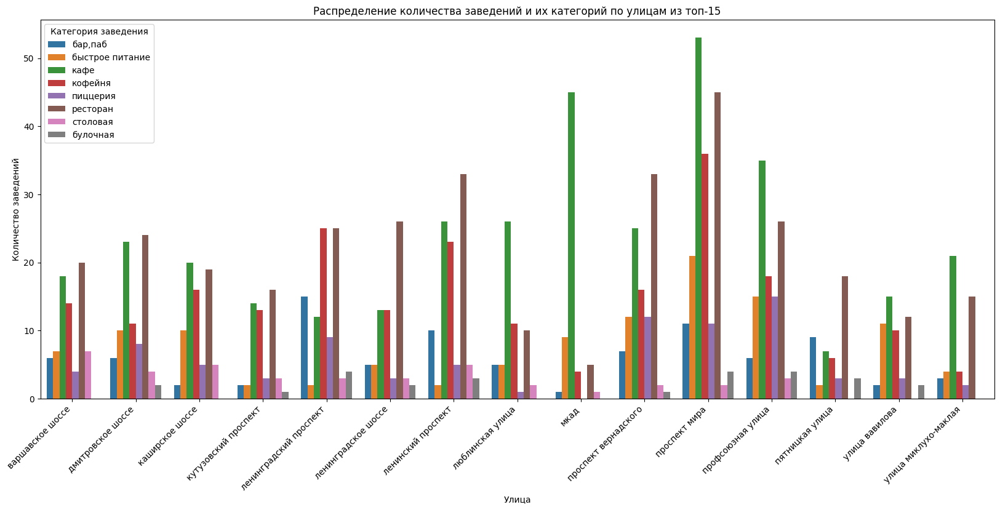

In [36]:
grouped = df_top_15_streets.groupby(['street', 'category'])['name'].count().reset_index()
plt.figure(figsize=(20, 8))
sns.barplot(x='street', y='name', hue='category', data=grouped)
plt.title('Распределение количества заведений и их категорий по улицам из топ-15')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Категория заведения')
plt.show()

Можно сделать вывод что наибольшее количество заведений находится на Проспекте Мира. Это можно объяснить очень большой протяженностью данной улицы и большим количеством туристических мест на ней. Также необходимо отметить большое количество кафе на МКАДЕ, которое явно выделяется в сравнении с количествами кафе на других представленных улицах.

Найдём улицы, на которых находится только один объект общепита.

In [37]:
street_one_place = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').query("name == 1").reset_index()
onlyone_street = street_one_place['street']
data_onlyone_street = data.query("street in @onlyone_street")

In [38]:
data_onlyone_street['street'].unique()

array(['улица бусиновская горка', 'прибрежный проезд',
       'парк левобережный', 'угличская улица',
       'ландшафтный заказник лианозовский',
       'лианозовский парк культуры и отдыха', 'новгородская улица',
       'парк алтуфьево', 'бибиревская улица', 'лианозовский проезд',
       'челобитьевское шоссе', 'костромская улица',
       'проектируемый проезд № 5265', 'улица 800-летия москвы',
       'вагоноремонтная улица', 'мурановская улица', 'улица конёнкова',
       'улица грекова', 'чермянский проезд',
       'парк этнографическая деревня бибирево', 'челюскинская улица',
       'таёжная улица', 'парусный проезд', 'светлогорский проезд',
       'валдайский проезд', 'пулковская улица',
       '3-й лихачёвский переулок', 'талдомская улица',
       '3-й михалковский переулок', 'парк дружбы', 'проезд донелайтиса',
       'новопоселковая улица', 'новая улица', 'клинская улица',
       'коптевский бульвар д 18 а стр 1', 'улица кашёнкин луг',
       'северный бульвар', 'отрадный проезд

Теперь узнаем как распределены категории таких заведений.

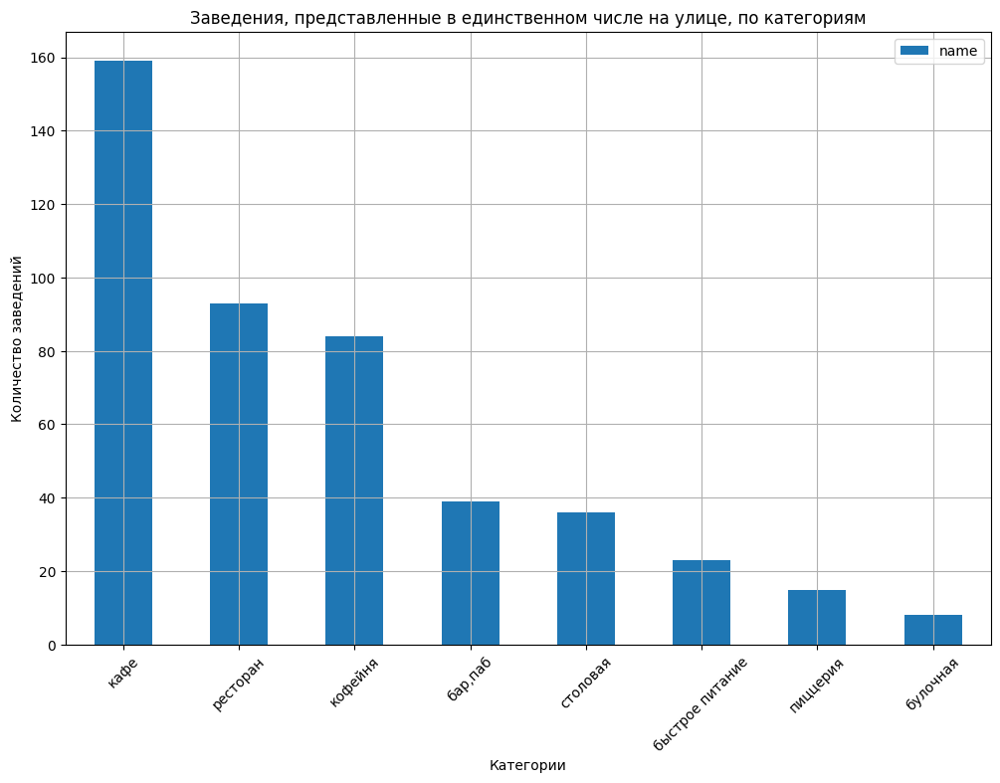

In [39]:
data_onlyone_street.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).plot(kind = 'bar', figsize=(12, 8))
plt.title('Заведения, представленные в единственном числе на улице, по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

Делаем вывод что явное лидерство у кафе, представленном в 159 раз в единственном числе.
Большое количествово улиц с одним заведением находятся в центре, это может быть связано с тем что в центре улицы короткие и невыгодно держать большое количество заведений на одной улице.
Относительно заведений в других районах можно сказать, что они далеко не все из них представляют собой уникальные и редкие объекты, которые могут иметь особый характер и привлекать внимание посетителей и туристов. И наличие только одного заведения на одной из таких улиц может означать, что эта улица не является популярной для размещения общепита, и потенциально может не иметь высокого трафика посетителей.

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района.

In [40]:
median_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. 

In [41]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Делаем вывод что наиболее высокий медианный чек в Центральном и Западном округах. Самый низкий - в Юго-Восточном административном округе (450 руб.). В остальных округах медианные чеки составляют от 500 до 700 руб. Можно сделать вывод что удалённость от центра влияет на величину медианного чека не во всех округах Москвы.

На основании анализа заведений общественного питания Москвы сформируем общие выводы:
* по количеству заведений лидируют кафе, чуть меньше количество ресторанов. Категория "Булочные" на последнем месте;
* больше всего посадочных мест предоставляют рестораны. Это объяснимо тем что в таком заведнии как правило собирается большое количество людей. Далее идут заведения быстрого питания, т.к они наиболее часто распространены в Москве. Для кафе, пиццерий и булочных посадочных мест меньше всего;
* в Москве 61.9% мест являются несетевыми. По графику видно, что большинство за несетевыми заведениями;
* наиболее популярная сеть в Москве - Шоколадница. На втором и третьем месте расположились два известных бренда пиццерий;
* из топ-15 больше наибольшее количество заведений находятся в Центральном административном округе. В основном это кафе, кофейни и рестораны. Примерно одинаковые показатели у Южного, Северного, Северо-Восточного и Западного административных округов. Здесь наибольшее количество раз представлена категория быстрого питания. Меньше всего заведений из топ-15 в Северо-Западном админинстративном округе;
* больше всего заведений располагается в Центральном административном округе. В нем преобладают кафе, кофейни и рестораны. Кафе распределены равномерно по всем округам;
* у категорий бар/паб наиболее высокий средний рейтинг 4.39. У пиццерий, ресторанов, кофеин и булочных примерно одинаковый рейтинг. Самый маленький рейтинг у ресторанов быстрого питания. Заметно что рейтинг никогда не опускается ниже 4;
* наиболее высокий рейтинг у заведений, расположенных в Центральном административном округе - 4.38. Самый низкий - в Юго-Восточном админинстратвном округе - 4.1;
* больше всего заведений расположено на проспекте Мира. В первую очередь преобладают кафе; 
* наиболее высокий медианный чек в Центральном и Западном округах. Самый низкий - в Юго-Восточном административном округе (450 руб.). 

<h3> Детализация исследования: открытие кофейни </h3>

Узнаем сколько всего кофеен в датасете.

In [42]:
data_coffee = data.query("category == 'кофейня'")
data_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24/7            1398 non-null   object 
dtypes: float64(6), int64(1),

Всего 1413 кофеин в представленном датасете

Теперь узнаем в каких районах их больше всего, каковы особенности их расположения.

In [43]:
coffee_district = data_coffee.groupby('district', as_index=False)['name'].agg('count').sort_values('name', ascending=False)

# создаём карту Москвы
с = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(с)

# выводим карту
с

Видим что большая часть заведений располагается в Центральном административном округе. Меньше всего заведений - в восточной и южной частях города.

Узнаем есть ли круглосуточные кофейни.

In [44]:
coffee_24_7 = data_coffee[data_coffee['is_24/7'] == True]

In [45]:
coffee_24_7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59 entries, 200 to 7923
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               59 non-null     object 
 1   category           59 non-null     object 
 2   address            59 non-null     object 
 3   district           59 non-null     object 
 4   hours              59 non-null     object 
 5   lat                59 non-null     float64
 6   lng                59 non-null     float64
 7   rating             59 non-null     float64
 8   price              25 non-null     object 
 9   avg_bill           28 non-null     object 
 10  middle_avg_bill    13 non-null     float64
 11  middle_coffee_cup  15 non-null     float64
 12  chain              59 non-null     int64  
 13  seats              37 non-null     float64
 14  street             59 non-null     object 
 15  is_24/7            59 non-null     object 
dtypes: float64(6), int64(1),

В датасете представлено 59 круглосуточных кофеин

Теперь узнаем какие у кофеен рейтинги и как они распределяются по районам.

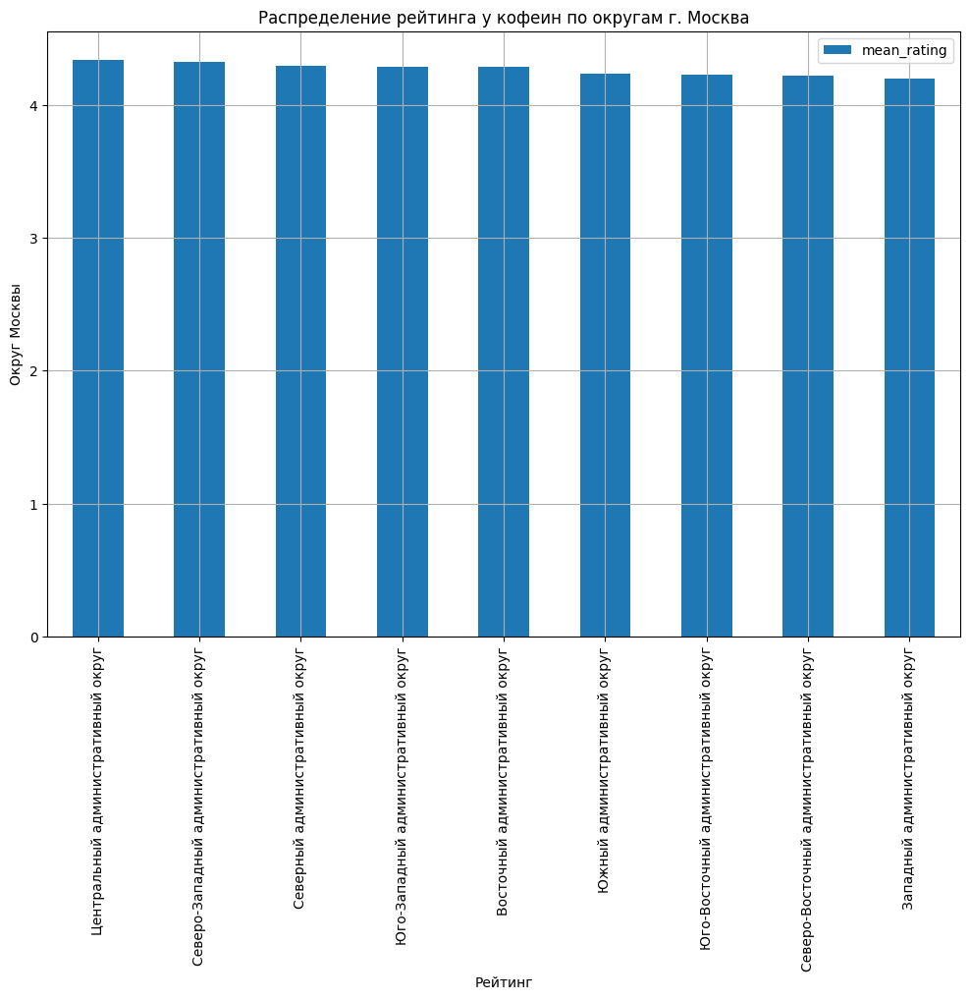

In [46]:
coffee_district_rating = data_coffee.groupby('district').agg(mean_rating=('rating', 'mean')).sort_values(by='mean_rating', ascending=False).reset_index()
coffee_district_rating.plot(kind = 'bar', figsize=(12, 8), x='district', y='mean_rating')
plt.title('Распределение рейтинга у кофеин по округам г. Москва')
plt.ylabel('Округ Москвы')
plt.xlabel('Рейтинг')
plt.grid()
plt.show()

Видим что кафейни с самым высоким средним рейтингом расположены в Центральном административном округе и Северо-Западном административном округе. Самый низкий средний рейтинг у кофеин, расположенных в Западном административном округе.

Теперь узнаем на какую стоимость чашки капучино стоит ориентироваться при открытии и почему

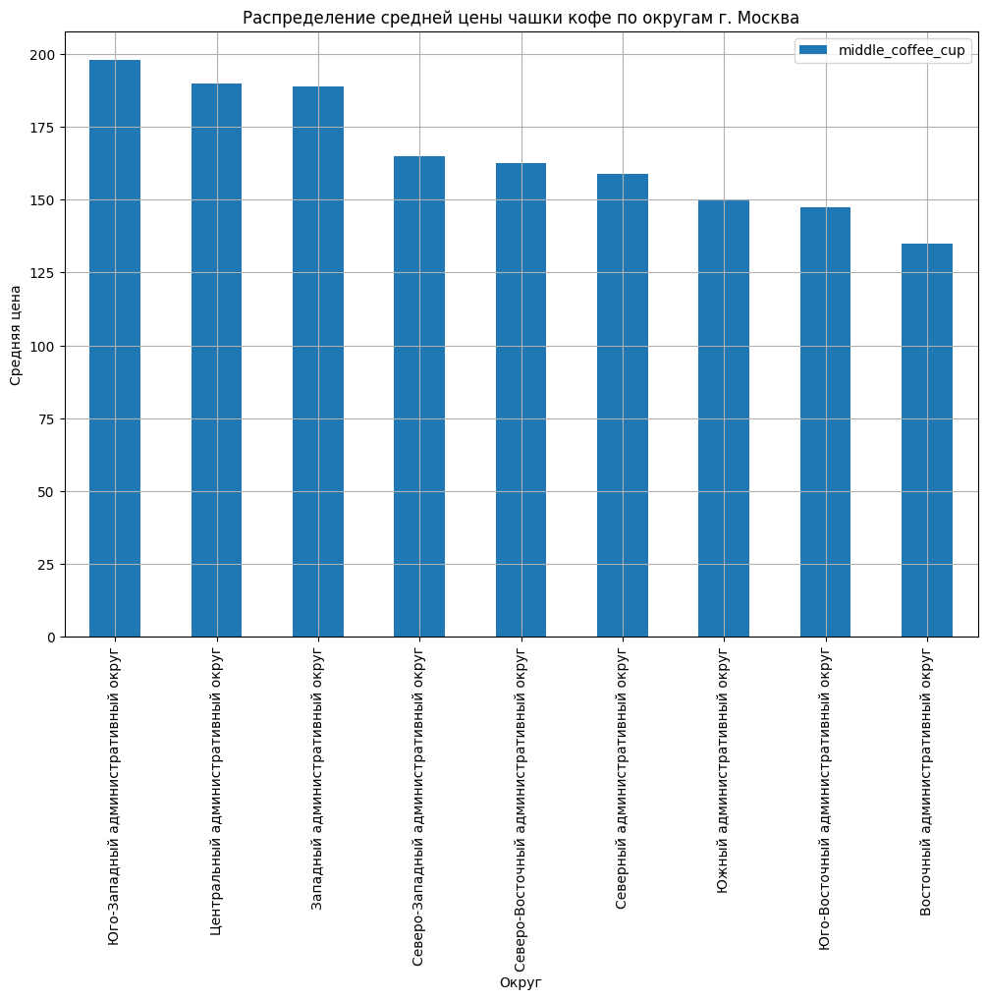

In [47]:
middle_coffee_cup = data_coffee.pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'median').sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()
middle_coffee_cup.plot(kind = 'bar', figsize=(12, 8), x='district', y='middle_coffee_cup')
plt.title('Распределение средней цены чашки кофе по округам г. Москва')
plt.ylabel('Средняя цена')
plt.xlabel('Округ')
plt.grid()
plt.show()

На основании приведённого анализа можно дать следующие рекомендации:
* при открытии кофейни стоит рассмотреть следующие районы: Центральный, Западный и Юго-Западный. В этих районах высокая средняя стоимость чашки кофе. Это даёт возможность установить цену чашки кофе меньше чем у конкурентов в данных округах для привлечения клиентов;
* если будет выбран Западный административный округ для открытия, то стоит рассмотреть возможность сделать её круглосуточной т. к. в данном округе таких заведений меньше всего. Это может привлечь дополнительных посетителей и увеличить доходы бизнеса;
* nакже можно отметить, что Западный административный округ привлекателен для открытия тем, что в нем самый низкий средний рейтинг у кофеин, что может стать преимуществом при открытии нового заведения и при успешном старте можно стать самым популярным заведением в данном районе. 